In case plots are not displayed, please mark the notebook as Trusted in the notebook top right corner (on the left of the kernel indicator)

In [1]:
import pandas as pd
import plotly.express as px
import zipfile
import matplotlib.pyplot as plt

from lightgbm import LGBMClassifier, early_stopping, log_evaluation
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, precision_recall_curve, average_precision_score, confusion_matrix, roc_curve

# 1. Download flux.csv

Extracting and visualizing the initial data

In [2]:
zf = zipfile.ZipFile('flux.csv.zip')
watersheds = pd.read_csv(zf.open('flux.csv'))
watersheds

,date,basin_id,flux,precip,temp_max,gauge_name,lat,lon,mean_elev,area_km2
0,1980-01-01,1001001,0.579,0.0,10.685653,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
1,1980-01-02,1001001,0.543,0.0,11.470960,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
2,1980-01-03,1001001,0.482,0.0,11.947457,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
3,1980-01-04,1001001,0.459,0.0,12.424489,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
4,1980-01-05,1001001,0.436,0.0,12.649203,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
...,...,...,...,...,...,...,...,...,...,...
4180475,2020-06-02,12930001,0.375,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180476,2020-06-03,12930001,0.342,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180477,2020-06-04,12930001,0.325,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180478,2020-06-05,12930001,0.311,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617


# 2. Perform an EDA

Data summary

In [3]:
watersheds.describe()

,basin_id,flux,precip,temp_max,lat,lon,mean_elev,area_km2
count,4.180480e+06,4.180480e+06,4.175037e+06,4.175037e+06,4.180480e+06,4.180480e+06,4.180480e+06,4.180480e+06
mean,7.179757e+06,5.253340e+01,2.947445e+00,1.365728e+01,-3.569572e+01,-7.129595e+01,1.760129e+03,2.404876e+03
std,3.180965e+06,1.676027e+02,8.766749e+00,6.615037e+00,8.047659e+00,1.254339e+00,1.382121e+03,4.322051e+03
min,1.001001e+06,0.000000e+00,0.000000e+00,-1.160359e+01,-5.494690e+01,-7.366670e+01,1.181229e+02,1.789123e+01
25%,4.558001e+06,8.680000e-01,0.000000e+00,9.162867e+00,-3.915000e+01,-7.231670e+01,5.847012e+02,3.761001e+02
50%,7.350003e+06,5.171000e+00,0.000000e+00,1.321396e+01,-3.588420e+01,-7.137190e+01,1.195311e+03,8.205541e+02
75%,9.416001e+06,2.990000e+01,6.422626e-01,1.805745e+01,-3.126560e+01,-7.050670e+01,3.048161e+03,2.461610e+03
max,1.293000e+07,1.580500e+04,2.132120e+02,4.081117e+01,-1.784280e+01,-6.763920e+01,4.910152e+03,5.224367e+04


Checking invalid values

In [4]:
watersheds.isnull().sum()

date             0
basin_id         0
flux             0
precip        5443
temp_max      5443
gauge_name       0
lat              0
lon              0
mean_elev        0
area_km2         0
dtype: int64

Checking variable types

In [5]:
watersheds.dtypes

date           object
basin_id        int64
flux          float64
precip        float64
temp_max      float64
gauge_name     object
lat           float64
lon           float64
mean_elev     float64
area_km2      float64
dtype: object

Dataframe after preprocessing

In [6]:
watersheds.dropna(inplace=True)
watersheds.rename(columns={'temp_max': 'temp'}, inplace=True)
watersheds['date'] = pd.to_datetime(watersheds['date'])
watersheds = watersheds.astype({'basin_id': 'str'})
watersheds

,date,basin_id,flux,precip,temp,gauge_name,lat,lon,mean_elev,area_km2
0,1980-01-01,1001001,0.579,0.000000,10.685653,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
1,1980-01-02,1001001,0.543,0.000000,11.470960,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
2,1980-01-03,1001001,0.482,0.000000,11.947457,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
3,1980-01-04,1001001,0.459,0.000000,12.424489,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
4,1980-01-05,1001001,0.436,0.000000,12.649203,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
...,...,...,...,...,...,...,...,...,...,...
4180443,2020-04-25,12930001,0.431,0.000000,4.138484,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180444,2020-04-26,12930001,0.362,0.000000,7.685259,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180445,2020-04-27,12930001,0.342,0.000000,9.646850,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180446,2020-04-28,12930001,0.359,0.000000,8.154713,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617


Distribution of the flux, precipitation and temperature measurement values. Flux and precipitation value are displayed in logarithmic scale to aid visualization.

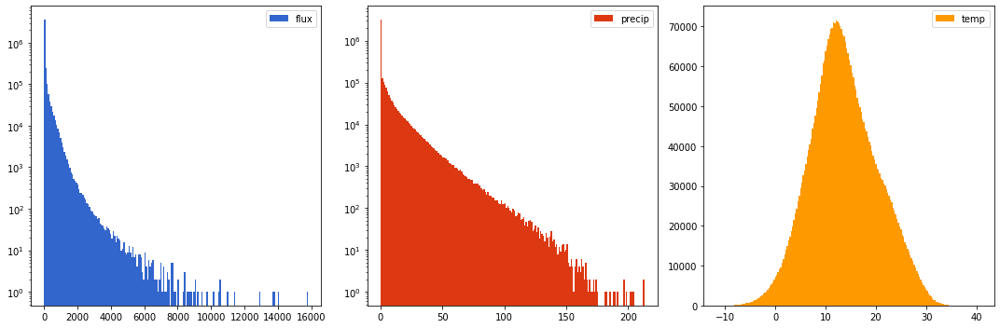

In [7]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,5))
ax1.hist(watersheds['flux'], bins=200, color='#3366CC', label='flux', log=True)
ax1.legend()
ax2.hist(watersheds['precip'], bins=200, color='#DC3912', label='precip', log=True)
ax2.legend()
ax3.hist(watersheds['temp'], bins=200, color='#FF9900', label='temp')
ax3.legend()
plt.tight_layout()
plt.show()

# 3. Plot flux, temperature and precipitations

Exception added to not allow the display of variables other than flux, precipitation and temperature. In case of any invalid argument, exceptions are handled by pandas itself already.

In [8]:
class InvalidVariable(Exception):
    def __init__(self, value, message="Variable should be one of ['flux', 'precip', 'temp']"):
        self.value = value
        self.message = message
        super().__init__(self.message)
    
    def __str__(self):
        return f'{self.message}, but received: {self.value}'


def plot_one_timeserie(cod_station, variable, min_date, max_date):
    if variable not in ['flux', 'precip', 'temp']:
        raise InvalidVariable(variable)    
    
    station = watersheds['basin_id'] == cod_station
    lower_date = watersheds['date'] >= min_date
    upper_date = watersheds['date'] <= max_date
    
    fig = px.line(watersheds[(station) & (lower_date) & (upper_date)], x = 'date', y = variable, 
                  color_discrete_sequence = px.colors.qualitative.G10)
    fig.show()
    
plot_one_timeserie('1001001', 'flux', '1993-09-19', '1996-12-15')

Flux, precipitation and temperature measurements normalized between [0,1] for the given station

In [9]:
def plot_three_timeseries(cod_station, min_date, max_date):      
    station = watersheds['basin_id'] == cod_station
    df = watersheds[station].copy()
    
    lower_date = df['date'] >= min_date
    upper_date = df['date'] <= max_date
    
    norm_values = df[['flux', 'precip', 'temp']].values
    min_max_scaler = MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(norm_values)
    df[['flux', 'precip', 'temp']] = x_scaled
    
    fig = px.line(df[(lower_date) & (upper_date)], x = 'date', y = ['flux', 'precip', 'temp'], 
                  color_discrete_sequence = px.colors.qualitative.G10)
    fig.update_yaxes(title = 'norm_value')
    fig.show()
    
plot_three_timeseries('1001001', '1993-09-19', '1996-12-15')

# 4. Create extreme variables

Extreme values of a distribution are their highest/smallest values, hence extreme events would have their measurements located at the extremities of their respective distributions. Since the problem focus on heat waves and peak flow events (high temperatures/flux/precipitation), only the highest values are of interest thus using 90/95/99th percentile as a threshold is a good way to capture the extreme events. Depending on how rare the modeled events are perceived to be, an alternative would be to use the interquartile range (IQR) to determine the outliers in the right tail of the distribution and treat them as the extreme events. However that process would generate far fewer points than using the percentiles.

In [10]:
watersheds['season'] = watersheds['date'].dt.month % 12 // 3 + 1
quantiles = watersheds.groupby('season', as_index=False)[['flux', 'precip', 'temp']].quantile(0.95)
quantiles

,season,flux,precip,temp
0,1,185.0,7.404016,28.260483
1,2,170.0,18.092802,24.159966
2,3,407.0,30.503264,16.085831
3,4,310.0,13.672440,22.571383


A new variable named season is created to represent the meteorological season during a measurement given its date. Unlike astronomical seasons (that are defined by the position of the Earth in relation to the sun), meteorological seasons are defined by the temperature cycle throughout the year, splitting the seasons in four periods of three months each starting in the first day of December, March, June and September respectively.

In [11]:
for season in range(1, 5):
    quantile = watersheds.loc[watersheds['season'] == season]['flux'].quantile(0.95)
    watersheds.loc[watersheds['season'] == season, 'flux_extreme'] = watersheds['flux'].apply(lambda x: 1 if x > quantile else 0)
    
    quantile = watersheds.loc[watersheds['season'] == season]['precip'].quantile(0.95)
    watersheds.loc[watersheds['season'] == season, 'precip_extreme'] = watersheds['precip'].apply(lambda x: 1 if x > quantile else 0)
    
    quantile = watersheds.loc[watersheds['season'] == season]['temp'].quantile(0.95)
    watersheds.loc[watersheds['season'] == season, 'temp_extreme'] = watersheds['temp'].apply(lambda x: 1 if x > quantile else 0)

watersheds = watersheds.astype({'flux_extreme': 'int', 'precip_extreme': 'int', 'temp_extreme': 'int'})
watersheds

,date,basin_id,flux,precip,temp,gauge_name,lat,lon,mean_elev,area_km2,season,flux_extreme,precip_extreme,temp_extreme
0,1980-01-01,1001001,0.579,0.000000,10.685653,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859,1,0,0,0
1,1980-01-02,1001001,0.543,0.000000,11.470960,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859,1,0,0,0
2,1980-01-03,1001001,0.482,0.000000,11.947457,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859,1,0,0,0
3,1980-01-04,1001001,0.459,0.000000,12.424489,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859,1,0,0,0
4,1980-01-05,1001001,0.436,0.000000,12.649203,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4180443,2020-04-25,12930001,0.431,0.000000,4.138484,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617,2,0,0,0
4180444,2020-04-26,12930001,0.362,0.000000,7.685259,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617,2,0,0,0
4180445,2020-04-27,12930001,0.342,0.000000,9.646850,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617,2,0,0,0
4180446,2020-04-28,12930001,0.359,0.000000,8.154713,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617,2,0,0,0


# 5. Plot extreme flux

Different behaviors can be observed taking the seasons into account: watersheds with few extreme flux events concentrated in a single season, watersheds with variable number of occurences of extreme flux depending on the season and watersheds with similar amount of extreme flux occurences in all seasons. In addition to that there are watersheds with no single occurence of extreme flux.

In [12]:
fig = px.bar(watersheds.groupby(['basin_id', 'season'], as_index=False).agg({'flux_extreme': 'sum'}), 
             x='basin_id', y='flux_extreme', facet_row='season', height=1000,
             color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

# 6. Extreme events over time

There is a growth trend in extreme events from 2016 on, but overall the percentage of extreme events fluctuated a lot throughout the years. Therefore taking into account the entire date range available, extreme events aren't becoming more frequent altogether. However, there has been an increase in frequency in the last five years (2016-2020).

In [13]:
watersheds['year'] = watersheds['date'].dt.year

extremes = watersheds.groupby(['year'], as_index=False).agg({'flux_extreme': 'sum', 'precip_extreme': 'sum', 
                                                             'temp_extreme': 'sum', 'basin_id': 'count'})
extremes['events'] = (extremes['flux_extreme'] + extremes['precip_extreme'] + extremes['temp_extreme']) / extremes['basin_id'] * 100

fig = px.line(extremes, x='year', y='events', color_discrete_sequence=px.colors.qualitative.G10)
fig.update_yaxes(title='extreme_events_per_100')
fig.show()

# 7. Extreme flux prediction

Since the task is about predicting extreme flux, flux measurements were not included in the model. The goal of the following model is to predict the probability of a extreme flux event in a watershed in any given day according to: 

* Average precipitation and maximum average temperature measurements in that day (precip, temp)
* Geolocation of the watershed in terms of its latitude and longitude (lat, lon)
* Other geografical caracteristics of the watershed (mean_elev, area_km2)
* Indication of whether the precipitation and measurements are considered extreme for that season (precip_extreme, temp_extreme)
* Which season the measurements were taken (season_1, season_2, season_3, season_4)

Information about season (generated from date and one-hot-encoded in four variables representing each one of the seasons) was added to the model due to the fact it is a pivotal element in the process of determining if a precipitation, temperature or flux measurement is extreme or not. For that reason, the exact date on which the measurements were taken are not included in the model.

An alternative not addressed in this notebook would be attempting to predict the flux in a single watershed using the historical data of its flux measurements for a given number of days after its most recent flux measurement and then determining if the predictions would be considered extreme or not for that time of the year according to their date/season information.

In [14]:
X = watersheds[['precip', 'temp', 'lat', 'lon', 'mean_elev', 'area_km2', 
                'season', 'precip_extreme', 'temp_extreme']].copy()
y = watersheds['flux_extreme'].copy()

X = pd.concat([X, pd.get_dummies(X.season, prefix='season')], axis=1)
X.drop(['season'], axis=1, inplace=True)
X

,precip,temp,lat,lon,mean_elev,area_km2,precip_extreme,temp_extreme,season_1,season_2,season_3,season_4
0,0.000000,10.685653,-18.0769,-69.1961,4842.449328,49.711859,0,0,1,0,0,0
1,0.000000,11.470960,-18.0769,-69.1961,4842.449328,49.711859,0,0,1,0,0,0
2,0.000000,11.947457,-18.0769,-69.1961,4842.449328,49.711859,0,0,1,0,0,0
3,0.000000,12.424489,-18.0769,-69.1961,4842.449328,49.711859,0,0,1,0,0,0
4,0.000000,12.649203,-18.0769,-69.1961,4842.449328,49.711859,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4180443,0.000000,4.138484,-54.9469,-67.6392,520.849289,20.645617,0,0,0,1,0,0
4180444,0.000000,7.685259,-54.9469,-67.6392,520.849289,20.645617,0,0,0,1,0,0
4180445,0.000000,9.646850,-54.9469,-67.6392,520.849289,20.645617,0,0,0,1,0,0
4180446,0.000000,8.154713,-54.9469,-67.6392,520.849289,20.645617,0,0,0,1,0,0


Selected predictor was LightGBM, while data was split in train-validation-test sets with 80/10/10% proportion.

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_valid, X_test, y_valid, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=0)

clf = LGBMClassifier()
clf.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric='average_precision',
        callbacks=[log_evaluation(1), early_stopping(10)])

[1]	valid_0's average_precision: 0.773216	valid_0's binary_logloss: 0.141975
Training until validation scores don't improve for 10 rounds
[2]	valid_0's average_precision: 0.794598	valid_0's binary_logloss: 0.12727
[3]	valid_0's average_precision: 0.799927	valid_0's binary_logloss: 0.116844
[4]	valid_0's average_precision: 0.812958	valid_0's binary_logloss: 0.108216
[5]	valid_0's average_precision: 0.816835	valid_0's binary_logloss: 0.10163
[6]	valid_0's average_precision: 0.819177	valid_0's binary_logloss: 0.096092
[7]	valid_0's average_precision: 0.820533	valid_0's binary_logloss: 0.0914045
[8]	valid_0's average_precision: 0.830599	valid_0's binary_logloss: 0.0873246
[9]	valid_0's average_precision: 0.834363	valid_0's binary_logloss: 0.0835557
[10]	valid_0's average_precision: 0.83597	valid_0's binary_logloss: 0.0804184
[11]	valid_0's average_precision: 0.83822	valid_0's binary_logloss: 0.0775862
[12]	valid_0's average_precision: 0.839355	valid_0's binary_logloss: 0.0751864
[13]	valid

LGBMClassifier()

# 8. Analyze model results

The trained model has achieved 0.87 of average precision score in the test set. The average precision score computes the value of the area under the curve of the precision-recall curve (PR AUC). This metric is suited for imbalanced classification problems focused in predict the probability of the minority class (positive outcome), which in this example is the occurence of a extreme flux event (flux_extreme = 1).

In [16]:
y_score = clf.predict_proba(X_test)[:, 1]
average_precision_score(y_test, y_score)

0.8694245689876048

The most important variables for the prediction were the ones found originally in the data (latitude, area, temperature, mean elevation, longitude and precipitation respectively) while season information had a small impact in the predictions. Information about extreme precipitation and temperature had little to no influence in the final results.

In [17]:
fig = px.bar(x=clf.feature_importances_, y=X.columns, orientation='h', text_auto='.2s', 
             color_discrete_sequence=px.colors.qualitative.G10)
fig.update_xaxes(title="Feature")
fig.update_yaxes(title="Importance")
fig.show()

Visualization of the precision-recall curve for the extreme flux prediction in the test set. Overall, an AUC score above 0.9 could be considered a very good result, which the trained model came close to. However, a further look at the true positive rate (sensitivity) is needed.

In [18]:
precision, recall, thresholds = precision_recall_curve(y_test, y_score)
auc_precision_recall = auc(recall, precision)

fig = px.line(x=recall, y=precision, color_discrete_sequence=px.colors.qualitative.G10)
fig.update_xaxes(title="Recall (Positive label: 1)")
fig.update_yaxes(title="Precision (Positive label: 1)")
fig.show()

Confusion matrix of the model:

* True negatives: 393525
* False positives: 3016
* False negatives: 5858
* True positives: 15105

In [19]:
y_pred = clf.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[393525,   3016],
       [  5858,  15105]], dtype=int64)

The trained model has been able to identify 72% of the extreme flux events in the test set. The usefulness of the model depends on how well the flux_extreme variable captures the real extreme watershed flux events, but for the chosen representation it achieves good results.

In [20]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
tpr[1]

0.720555264036636